In [45]:
#Libraries for data manipulation
import pandas as pd
import numpy as np

#Libraries for data visualization
import seaborn as sns
from matplotlib import pyplot as plt 
import plotly.express as px

#
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier

# Other libraries
import math
import warnings
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE


warnings.filterwarnings('ignore')

In [3]:
data = pd.read_csv('creditcard.csv')
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
data.describe().round(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,...,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00,284807.00
mean,94813.86,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,...,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,88.35,0.00
std,47488.15,1.96,1.65,1.52,1.42,1.38,1.33,1.24,1.19,1.10,...,0.73,0.73,0.62,0.61,0.52,0.48,0.40,0.33,250.12,0.04
min,0.00,-56.41,-72.72,-48.33,-5.68,-113.74,-26.16,-43.56,-73.22,-13.43,...,-34.83,-10.93,-44.81,-2.84,-10.30,-2.60,-22.57,-15.43,0.00,0.00
25%,54201.50,-0.92,-0.60,-0.89,-0.85,-0.69,-0.77,-0.55,-0.21,-0.64,...,-0.23,-0.54,-0.16,-0.35,-0.32,-0.33,-0.07,-0.05,5.60,0.00
50%,84692.00,0.02,0.07,0.18,-0.02,-0.05,-0.27,0.04,0.02,-0.05,...,-0.03,0.01,-0.01,0.04,0.02,-0.05,0.00,0.01,22.00,0.00
75%,139320.50,1.32,0.80,1.03,0.74,0.61,0.40,0.57,0.33,0.60,...,0.19,0.53,0.15,0.44,0.35,0.24,0.09,0.08,77.16,0.00
max,172792.00,2.45,22.06,9.38,16.88,34.80,73.30,120.59,20.01,15.59,...,27.20,10.50,22.53,4.58,7.52,3.52,31.61,33.85,25691.16,1.00


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [6]:
data.isnull().sum().sum()

0

In [7]:
data.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [8]:
data['Class'].value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

In [9]:
print("Percentage of fraud in dataset: ", round(data['Class'].value_counts()[1]/data.shape[0] * 100, 3), "%")
print("Percentage of no fraud in dataset: ", round(data['Class'].value_counts()[0]/data.shape[0] * 100, 3), "%")

Percentage of fraud in dataset:  0.173 %
Percentage of no fraud in dataset:  99.827 %


Dataset is very unbalanced. The majority of transactions (>99%) are not fraud!

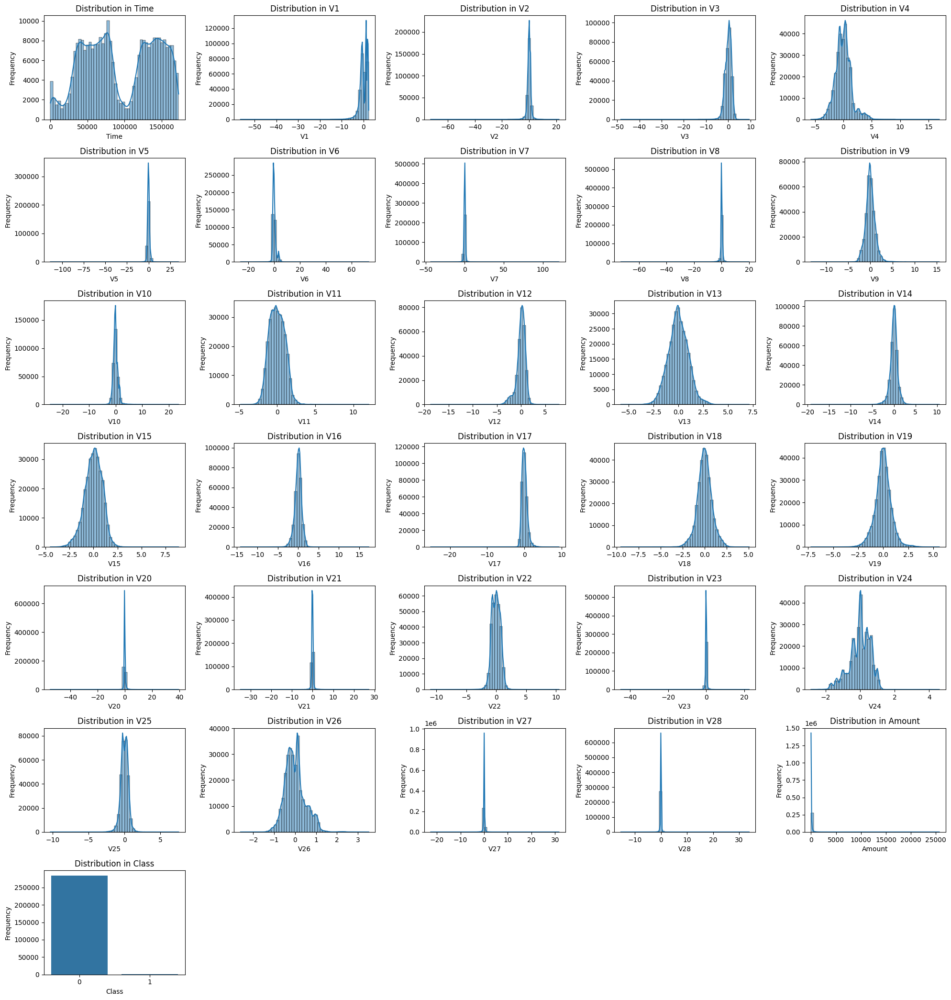

In [10]:
def plot_distribution(df, num_columns):
    '''
    This function is used to represent the distribution of the data in each column.
    It takes two parameters: data set, number of columns to be displayed per row.
    Data of type "object" or containing less than 10 unique values is displayed as "barplot", while other data is displayed as "histplot".
    '''
    num_cols = len(df.columns)
    num_rows = math.ceil(num_cols / num_columns)

    fig, axes = plt.subplots(num_rows, num_columns, figsize = (num_columns * 4, num_rows * 3))
    axes = axes.flatten()


    for i, col in enumerate(df.columns):
        ax = axes[i]
        
        if df[col].dtype == 'object' or df[col].nunique() < 10:
            distribution = df[col].value_counts()
            sns.barplot(x=distribution.index, y=distribution.values, ax = ax)
            ax.set_xlabel(col)
            ax.set_ylabel('Frequency')
            ax.set_title(f'Distribution in {col}')

        else:
            sns.histplot(df[col], kde=True, bins=50, ax = ax)
            ax.set_xlabel(col)
            ax.set_ylabel('Frequency')
            ax.set_title(f'Distribution in {col}')
          
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()


plot_distribution(data,5)

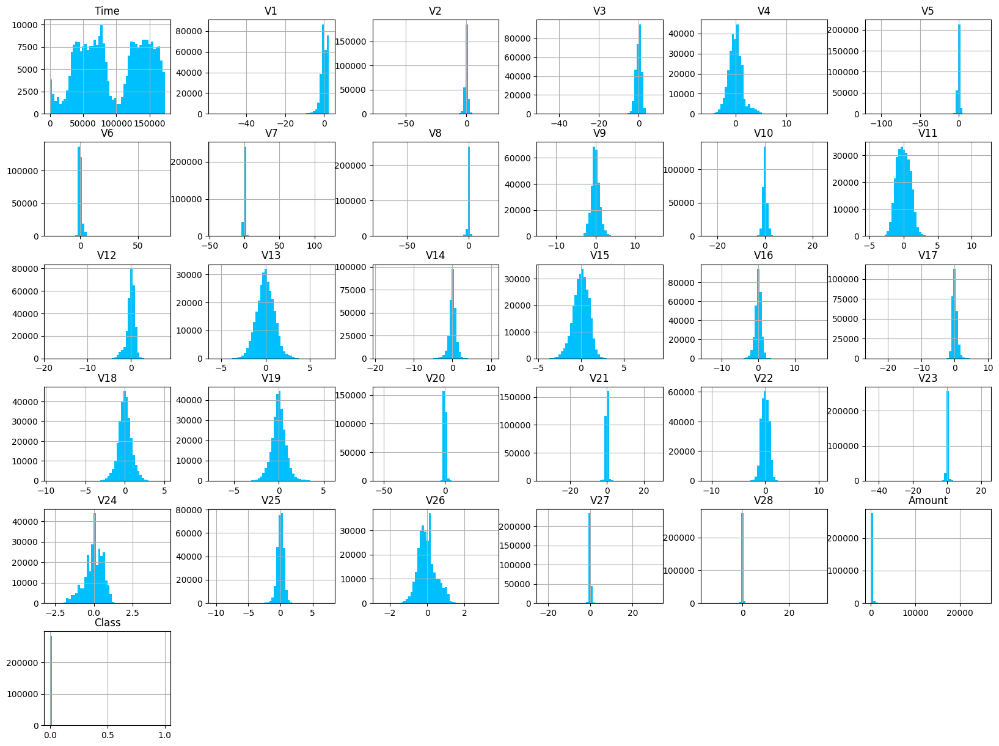

In [11]:
data.hist (bins=50, figsize=(20,15), color = 'deepskyblue')

plt.show()

In [12]:
fig = px.scatter_3d(data, x='Time', y='Amount', z='Class', color='Class',
                    title='3D Scatter Plot of transactions',
                     width=1000, height=800)

fig.show()

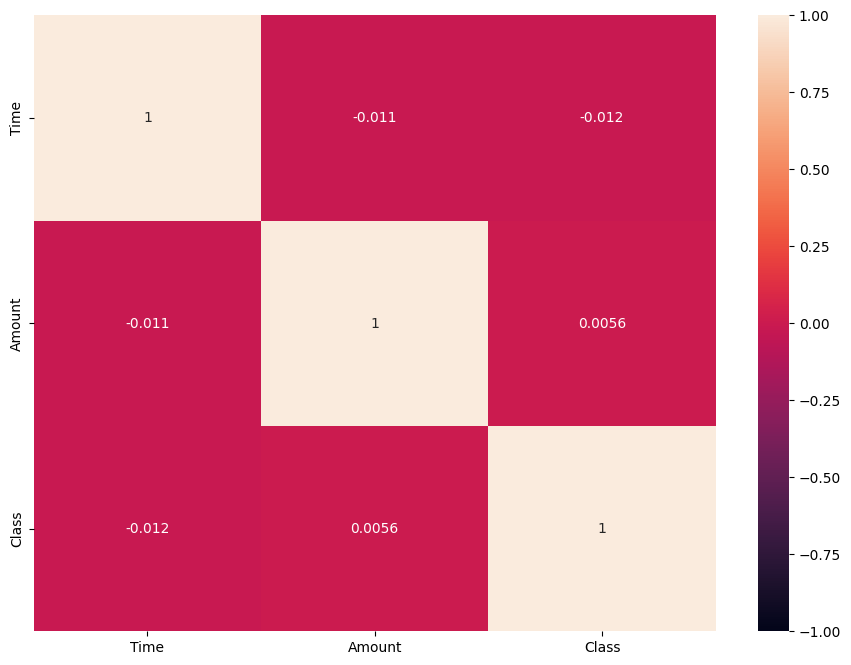

In [13]:
correlation = data[['Time', 'Amount', 'Class']].corr()

plt.figure(figsize=(11,8))
sns.heatmap(correlation, annot=True, vmin= -1, vmax= 1)
plt.show()

# Data preprocessing

I use RobustScaler because it handles the outliers better. This is because it scales the data based on median and IQR

In [14]:
df = data.copy()
df.head(1)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0


In [15]:
# Most of the data in the dataset is already been scaled. We have to scale columns: amount, time. 
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

# We use RobustScaler because it handles the outliers better. This is because it scales the data based on median and IQR

df['scaled_amount'] = rob_scaler.fit_transform(df['Amount'].values.reshape(-1,1))
df['scaled_time'] = rob_scaler.fit_transform(df['Time'].values.reshape(-1,1))

df.drop(['Time', 'Amount'], axis = 1, inplace = True)

first_col = df.pop('Class')
second_col = df.pop('scaled_amount')
third_col = df.pop('scaled_time')
df.insert(0, 'Class', first_col)
df.insert(1, 'Scaled_time', second_col)
df.insert(2, 'Scaled_amount', third_col)

df.head()

,Class,Scaled_time,Scaled_amount,V1,V2,V3,V4,V5,V6,V7,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,0,1.783274,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,...,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053
1,0,-0.269825,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,...,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724
2,0,4.983721,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,...,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752
3,0,1.418291,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,...,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458
4,0,0.670579,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,...,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153


In [16]:
X = data.drop(['Class'], axis = 1)
y = data["Class"]
print(X.shape)
print(y.shape)

(284807, 30)
(284807,)


In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42, shuffle=True, stratify=y)
print(f'X_train shape: {X_train.shape}')
print(f'Y_train shape: {y_train.shape}')
print(f'X_test shape: {X_test.shape}')
print(f'Y_test shape: {y_test.shape}')

X_train shape: (242085, 30)
Y_train shape: (242085,)
X_test shape: (42722, 30)
Y_test shape: (42722,)


In [18]:
print("Percentage of fraud transaction in TRAIN dataset: ", round(y_train.value_counts()[1]/y_train.shape[0] * 100, 4), "%")
print("Percentage of valid transaction in TRAIN dataset: ", round(y_train.value_counts()[0]/y_train.shape[0] * 100, 4), "%")
print("Percentage of fraud transaction in TEST dataset: ", round(y_test.value_counts()[1]/y_test.shape[0] * 100, 4), "%")
print("Percentage of valid transaction in TEST dataset: ", round(y_test.value_counts()[0]/y_test.shape[0] * 100, 4), "%")

Percentage of fraud transaction in TRAIN dataset:  0.1727 %
Percentage of valid transaction in TRAIN dataset:  99.8273 %
Percentage of fraud transaction in TEST dataset:  0.1732 %
Percentage of valid transaction in TEST dataset:  99.8268 %


In [19]:
FTr = round(y_train.value_counts()[1]/y_train.shape[0] * 100, 4) 
VTr = round(y_train.value_counts()[0]/y_train.shape[0] * 100, 4)
FTs = round(y_test.value_counts()[1]/y_test.shape[0] * 100, 4)
VTs = round(y_test.value_counts()[0]/y_test.shape[0] * 100, 4)

data_balance = pd.DataFrame({
    'Data' : ['Train', 'Test'],
    'Valid' : [VTr, VTs],
    'Fraud' : [FTr, FTs]
})
data_balance

,Data,Valid,Fraud
0,Train,99.8273,0.1727
1,Test,99.8268,0.1732


## Random undersampling

In [20]:
random_under_sampler = RandomUnderSampler(random_state=42)
X_train_under, y_train_under= random_under_sampler.fit_resample(X_train, y_train)
under_sample_df = pd.concat([X_train_under,y_train_under], axis=1)

counter = Counter(y_train_under)
counter

Counter({0: 418, 1: 418})

In [21]:
under_sample_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
114487,73507.0,-1.071424,0.476486,2.488280,0.298354,-0.766028,-0.071201,-0.117645,0.198360,0.663047,...,0.074060,0.260633,-0.062818,0.610529,-0.507010,0.234323,-0.259163,0.151486,25.80,0
170558,120239.0,-0.007939,-3.862567,-0.663163,2.306888,-2.009195,1.193780,-0.076492,0.165605,2.126952,...,0.715309,0.204058,-0.797613,-0.745617,-0.514126,-0.570116,-0.072444,0.145194,1000.00,0
102753,68347.0,-0.974941,0.689634,0.823912,-0.923401,1.579553,-1.074996,1.055522,-0.094849,-0.588977,...,-0.015863,-0.115064,-0.247861,-0.141180,0.127222,0.032042,-0.156552,-0.103905,0.76,0
126238,77966.0,-3.346802,3.228644,-3.065292,-0.123389,1.680012,4.924345,-5.059024,-8.774602,-2.326278,...,-5.044861,1.124007,0.522918,0.834492,-0.137025,0.417410,-0.388680,0.077036,0.76,0
90658,63109.0,1.130625,0.135082,0.209415,1.107220,-0.201906,-0.506614,0.126108,-0.051783,0.114135,...,0.066456,0.146626,-0.090211,0.063136,0.570298,-0.299493,0.017370,0.021273,40.52,0


In [22]:
print(f'y undersample shape: {y_train_under.shape}')
print(f'X undersample shape: {X_train_under.shape}')

y undersample shape: (836,)
X undersample shape: (836, 30)


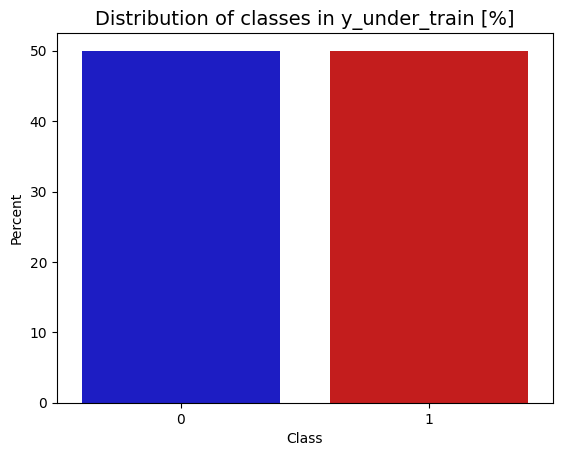

In [23]:
colors = ["#0101DF", "#DF0101"]
sns.countplot(x=y_train_under, palette=colors, stat= 'percent')
plt.xlabel('Class')
plt.ylabel('Percent')
plt.title('Distribution of classes in y_under_train [%]', fontsize=14)
plt.show()

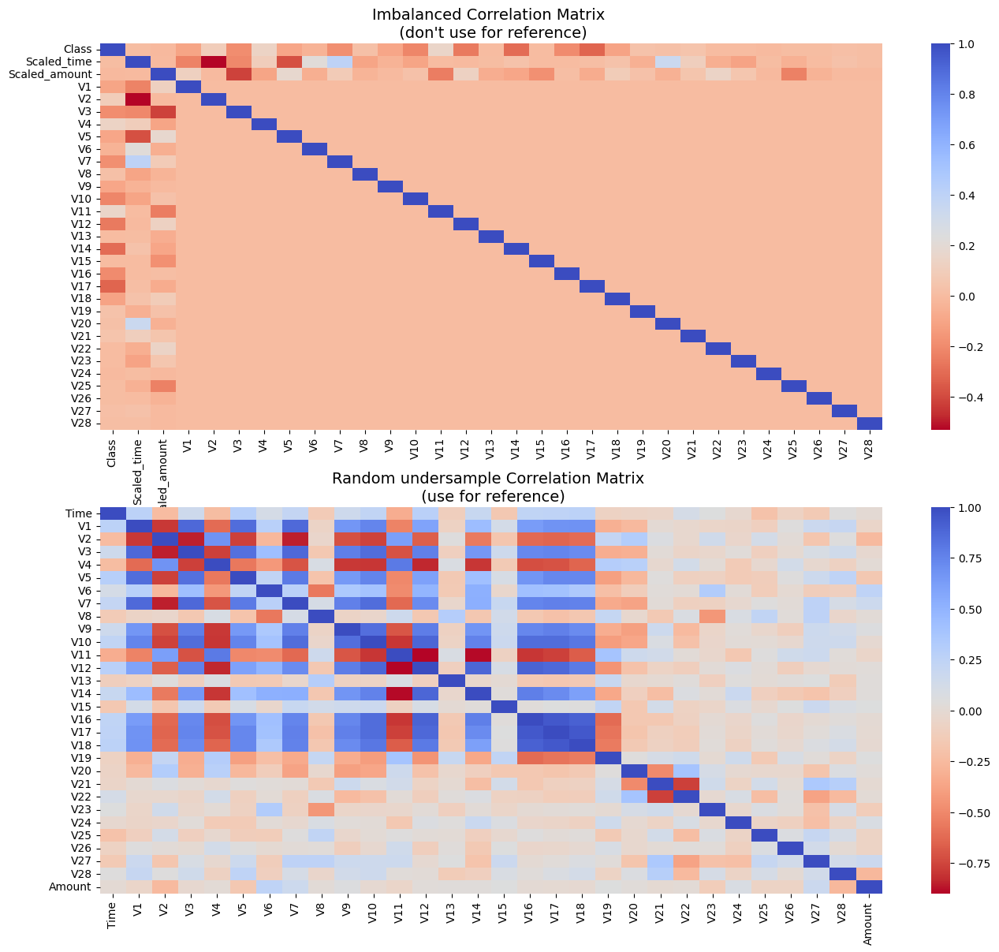

In [24]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(16,14))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


random_under_sample_corr = X_train_under.corr()
sns.heatmap(random_under_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('Random undersample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

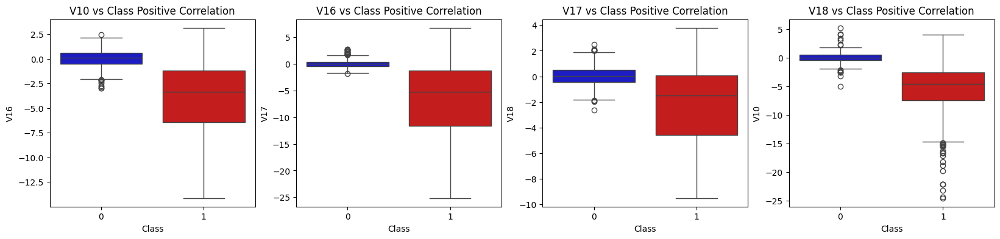

In [25]:
colors = ["#0101DF", "#DF0101"]
f, axes = plt.subplots(ncols=4, figsize=(20,4))

# Positive correlations (The higher the feature the probability increases that it will be a fraud transaction)
sns.boxplot(x="Class", y="V10", data=under_sample_df, palette=colors, ax=axes[3])
axes[0].set_title('V10 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V16", data=under_sample_df, palette=colors, ax=axes[0])
axes[1].set_title('V16 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V17", data=under_sample_df, palette=colors, ax=axes[1])
axes[2].set_title('V17 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V18", data=under_sample_df, palette=colors, ax=axes[2])
axes[3].set_title('V18 vs Class Positive Correlation')

plt.show()

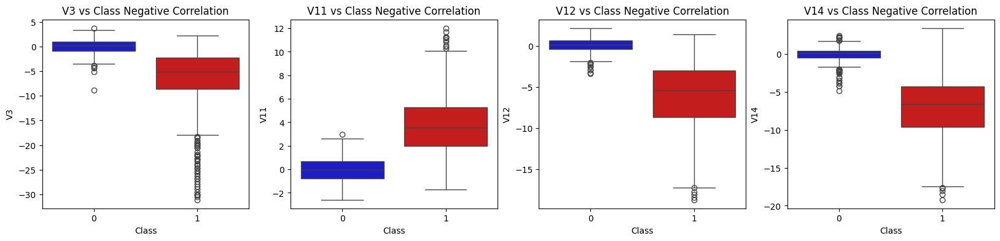

In [26]:
f, axes = plt.subplots(ncols=4, figsize=(20,4))

# Negative Correlations with our Class (The lower our feature value the more likely it will be a fraud transaction)
sns.boxplot(x="Class", y="V3", data=under_sample_df, palette=colors, ax=axes[0])
axes[0].set_title('V3 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V11", data=under_sample_df, palette=colors, ax=axes[1])
axes[1].set_title('V11 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V12", data=under_sample_df, palette=colors, ax=axes[2])
axes[2].set_title('V12 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V14", data=under_sample_df, palette=colors, ax=axes[3])
axes[3].set_title('V14 vs Class Negative Correlation')

plt.show()

## Random oversampling

In [27]:
random_over_sampler = RandomOverSampler(random_state=42)
X_train_over, y_train_over= random_over_sampler.fit_resample(X_train, y_train)
over_sampling_df = pd.concat([X_train_over, y_train_over], axis = 1)

counter = Counter(y_train_over)
counter

Counter({0: 241667, 1: 241667})

In [28]:
over_sampling_df.head()
over_sampling_df.shape

(483334, 31)

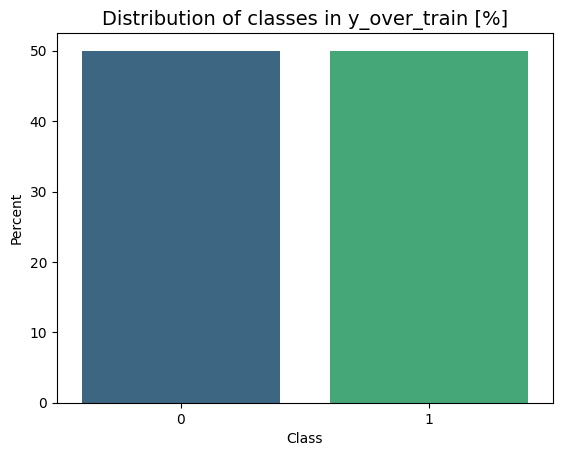

In [29]:
sns.countplot(x=y_train_over, palette='viridis', stat= 'percent')
plt.xlabel('Class')
plt.ylabel('Percent')
plt.title('Distribution of classes in y_over_train [%]', fontsize=14)
plt.show()

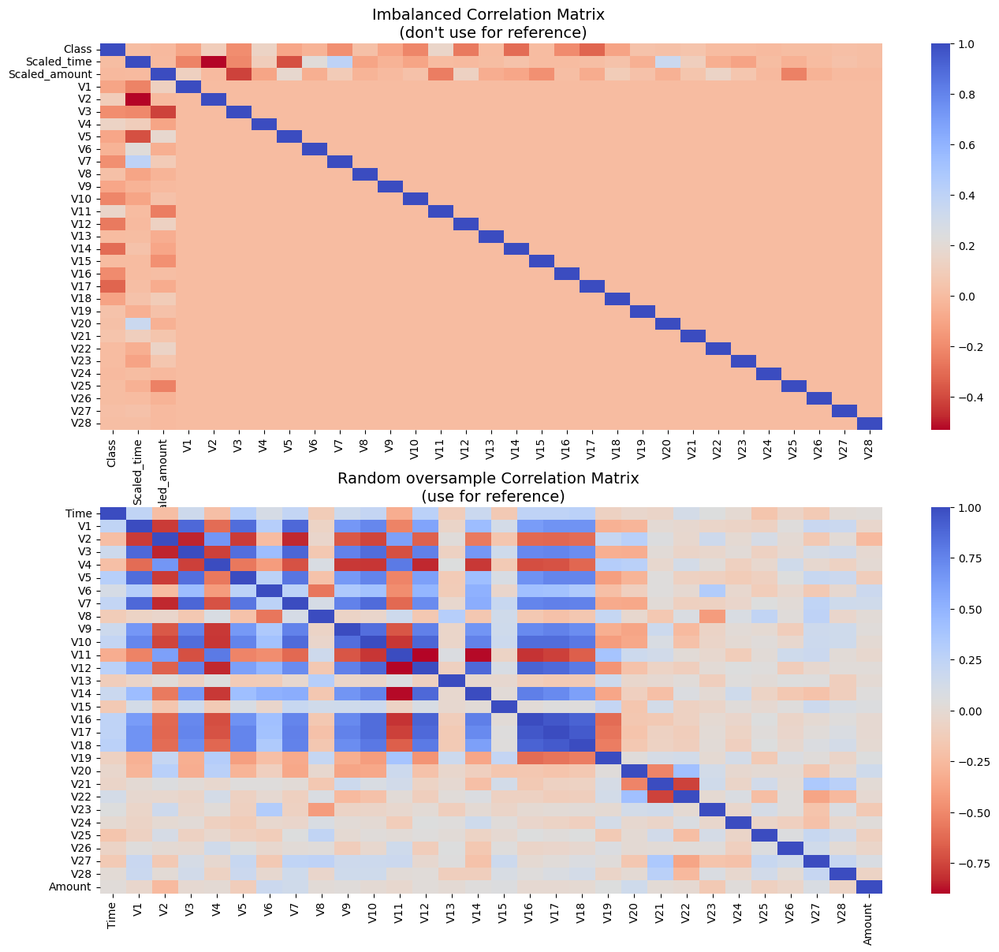

In [30]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(16,14))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


random_over_sample_corr = X_train_over.corr()
sns.heatmap(random_over_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('Random oversample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

## Oversampling with SMOTE

In [31]:
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
Counter(y_train_smote)

Counter({0: 241667, 1: 241667})

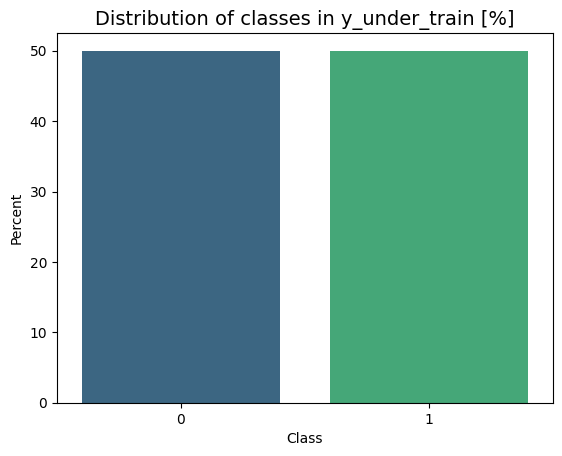

In [32]:
sns.countplot(x=y_train_smote, palette='viridis', stat= 'percent')
plt.xlabel('Class')
plt.ylabel('Percent')
plt.title('Distribution of classes in y_under_train [%]', fontsize=14)
plt.show()

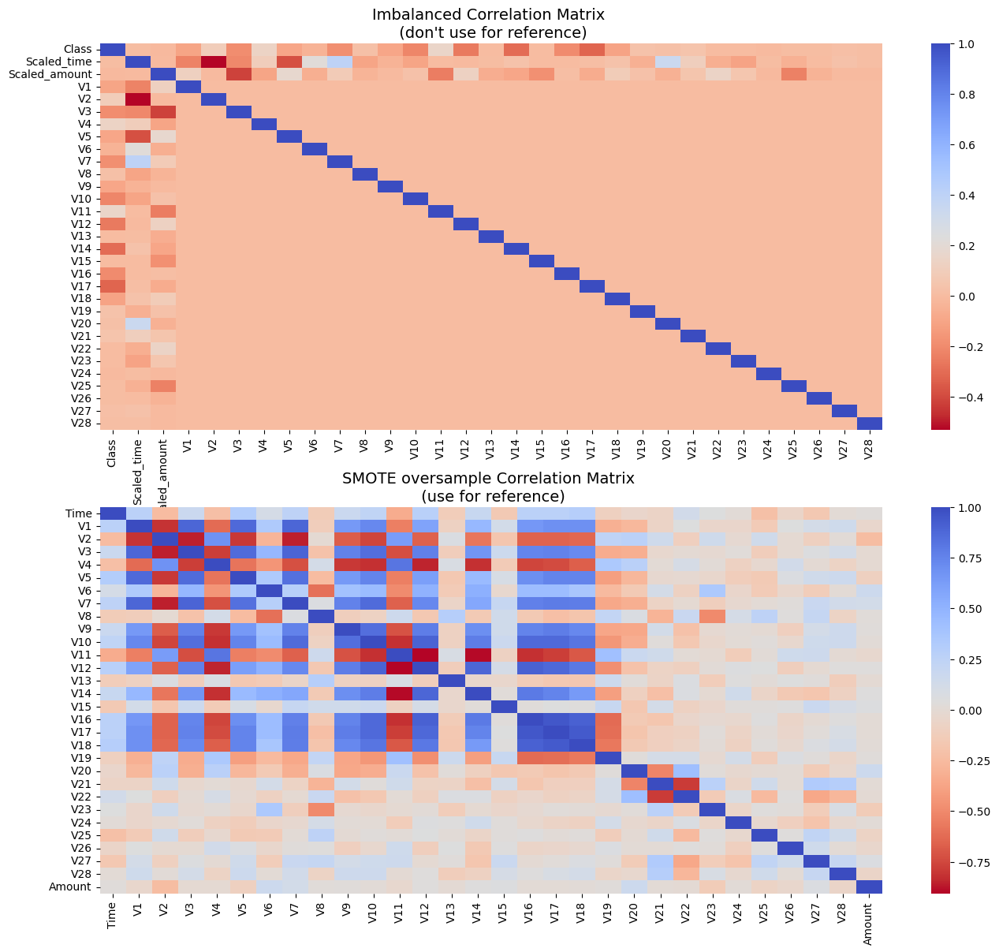

In [33]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(16,14))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)

smote_corr = X_train_smote.corr()
sns.heatmap(smote_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('SMOTE oversample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

In [48]:
classifiers = {
    "LogisticRegression": (
        LogisticRegression(),
            {"C": [0.1, 1, 10], 
            "penalty": ["l1", "l2"],
            "solver": ["liblinear"]}),

    "KNearest": (
        KNeighborsClassifier(),
            {"n_neighbors": [3, 5, 7],
            "weights": ["uniform", "distance"]}),
    "DecisionTreeClassifier": (
        DecisionTreeClassifier(),
        {"max_depth": [None, 10, 20], "min_samples_split": [2, 5, 10]}),
    "DummyClassifier": (
        DummyClassifier(),
        {"strategy": ["most_frequent", "stratified"]}),
    "RandomForest": (
        RandomForestClassifier(),
        {"n_estimators": [50, 100], "max_features": ["sqrt", "log2"]}),
    #"Naive Bayes":
    #   GaussianNB(), # GaussianNB does not have many hyperparameters to tune
    "XGBoost": (
        GradientBoostingClassifier(),
        {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]})
}

In [49]:
classifiers_result_df = pd.DataFrame(columns=[
    'data', 'classifier', 'accuracy', 'precision', 'recall', 'fscore', 
    'TP', 'FP', 'TN',  'FN'
])

# Function to add results to the DataFrame
def add_results(data_type, classifier_name, y_true, y_pred):
    acc = round(accuracy_score(y_true, y_pred),3) 
    precision = round(precision_score(y_true, y_pred),3)
    recall = round(recall_score(y_true, y_pred),3)
    fscore = round(f1_score(y_true, y_pred),3)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    
    classifiers_result_df.loc[len(classifiers_result_df)] = [
        data_type, classifier_name, acc, precision, recall, fscore, 
        tp, fp, tn,  fn
    ]

# List of data sets to process
data_sets = [
    ('undersample', X_train_under, y_train_under),
    ('oversample', X_train_over, y_train_over),
    ('smote', X_train_smote, y_train_smote)
]

# Loop for each dataset and classifier
for data_name, X_train, y_train in data_sets:
    print(f"\nData processing: {data_name}")
    for key, (classifier, params) in classifiers.items():
        # Implementation of GridSearchCV
        grid_search = GridSearchCV(classifier, param_grid=params, cv=5, scoring='f1', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        
        # Best model after GridSearch
        best_classifier = grid_search.best_estimator_
        print(f"Classifier training: {best_classifier.__class__.__name__} is completed with best parameters: {grid_search.best_params_}")
        
        # Prediction on a test set
        y_pred = best_classifier.predict(X_test)
        add_results(data_name, best_classifier.__class__.__name__, y_test, y_pred)


classifiers_result_df


Data processing: undersample
Classifier training: LogisticRegression is completed with best parameters: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
Classifier training: KNeighborsClassifier is completed with best parameters: {'n_neighbors': 5, 'weights': 'distance'}
Classifier training: DecisionTreeClassifier is completed with best parameters: {'max_depth': None, 'min_samples_split': 2}
Classifier training: DummyClassifier is completed with best parameters: {'strategy': 'stratified'}
Classifier training: RandomForestClassifier is completed with best parameters: {'max_features': 'sqrt', 'n_estimators': 100}
Classifier training: GradientBoostingClassifier is completed with best parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}

Data processing: oversample
Classifier training: LogisticRegression is completed with best parameters: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
Classifier training: KNeighborsClassifier is completed with best parameters: {'n_

,data,classifier,accuracy,precision,recall,fscore,TP,FP,TN,FN
0,undersample,LogisticRegression,0.959,0.036,0.892,0.070,66,1743,40905,8
1,undersample,KNeighborsClassifier,0.660,0.004,0.716,0.007,53,14488,28160,21
2,undersample,DecisionTreeClassifier,0.914,0.018,0.892,0.035,66,3670,38978,8
3,undersample,DummyClassifier,0.502,0.002,0.716,0.005,53,21263,21385,21
4,undersample,RandomForestClassifier,0.984,0.090,0.905,0.163,67,680,41968,7
5,undersample,GradientBoostingClassifier,0.972,0.053,0.892,0.100,66,1186,41462,8
6,oversample,LogisticRegression,0.977,0.062,0.892,0.117,66,990,41658,8
7,oversample,KNeighborsClassifier,0.998,0.345,0.270,0.303,20,38,42610,54
8,oversample,DecisionTreeClassifier,0.999,0.714,0.743,0.728,55,22,42626,19
9,oversample,DummyClassifier,0.499,0.002,0.581,0.004,43,21394,21254,31
